<center> <h2><b>Machine Learning for Healthcare, Project 2: Interpretability and Explainability</b></h2> </center>
<h3><b>Part 2: Pneumonia Prediction Dataset</b></h3>

### Q1: Exploratory Data Analysis (4 Pts)

In [ ]:
import numpy as np
import pandas as pd
import os
import random
import cv2
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
from transforms import get_training_augmentation_pipeline

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Input, Dense, Conv2D, MaxPool2D, Flatten, Dropout, BatchNormalization, SpatialDropout2D, GlobalAveragePooling2D, LeakyReLU, ReLU, Concatenate
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.metrics import Precision, Recall, AUC
from tensorflow.keras.regularizers import l2
from sklearn.utils import shuffle
from sklearn.metrics import classification_report, confusion_matrix

import wandb
from wandb.integration.keras import WandbMetricsLogger
from wandb.integration.keras import WandbModelCheckpoint

random.seed(42)
np.random.seed(42)
tf.random.set_seed(42)

os.environ['TF_DETERMINISTIC_OPS'] = '1'

In [2]:
# Inspired by https://www.kaggle.com/code/madz2000/pneumonia-detection-using-cnn-92-6-accuracy

directories = ['NORMAL', 'PNEUMONIA']
img_size = 300

def get_image_data(data_dir):
    images = []
    label_values = []
    pneumonia_type = []

    for label in directories: 
        path = os.path.join(data_dir, label)
        class_num = directories.index(label)

        for img in os.listdir(path):
            try:
                img_arr = cv2.imread(os.path.join(path, img), cv2.IMREAD_GRAYSCALE) 
                resized_arr = cv2.resize(img_arr, (img_size, img_size))

                images.append(resized_arr / 255.0)  # Normalize the image
                label_values.append(class_num)

                if class_num == 1:  # PNEUMONIA
                    if 'bacteria' in img:
                        pneumonia_type.append(1)
                    elif 'virus' in img:
                        pneumonia_type.append(2)
                else:
                    pneumonia_type.append(0)
            
            except Exception as e:
                print(f"Error processing {img}: {e}")

    images = np.array(images).reshape(-1, img_size, img_size, 1)
    labels = np.array(label_values)  # 0 for NORMAL, 1 for PNEUMONIA
    pneumonia_type = np.array(pneumonia_type)
    return images, labels, pneumonia_type

X_train, y_train, type_train = get_image_data('chest_xray/train')
X_val, y_val, type_val = get_image_data('chest_xray/val')
X_test, y_test, type_test = get_image_data('chest_xray/test')

In [3]:
print("Training set label distribution:", np.unique(y_train, return_counts=True))
print("Validation set label distribution:", np.unique(y_val, return_counts=True))
print("Test set label distribution:", np.unique(y_test, return_counts=True))

Training set label distribution: (array([0, 1]), array([1341, 3875], dtype=int64))
Validation set label distribution: (array([0, 1]), array([8, 8], dtype=int64))
Test set label distribution: (array([0, 1]), array([234, 390], dtype=int64))


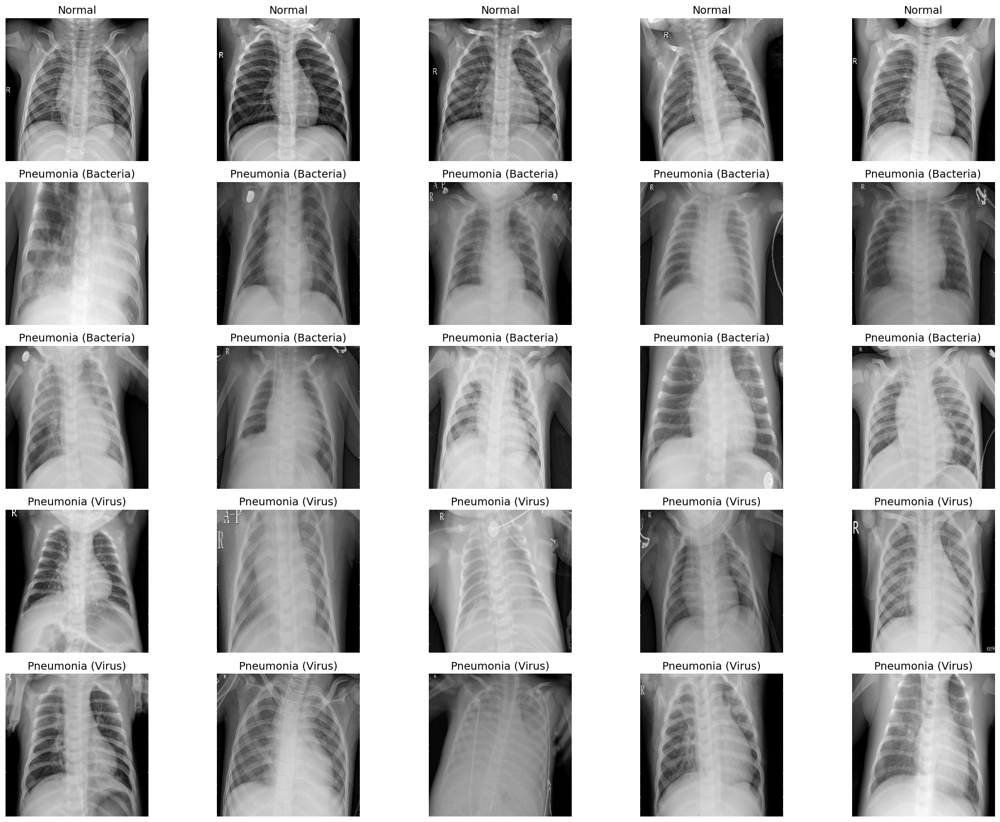

In [ ]:
def visualize_samples():
    plt.figure(figsize=(20, 15))

    np.random.seed(42)
    normal_indices = np.random.choice(np.nonzero(y_train == 0)[0], 5, replace=False)
    for i, idx in enumerate(normal_indices):
        plt.subplot(5, 5, i + 1)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Normal", fontsize=14)
        plt.axis('off')

    bacteria_indices = np.random.choice(np.nonzero(type_train == 1)[0], 5, replace=False)
    for i, idx in enumerate(bacteria_indices):
        plt.subplot(5, 5, i + 6)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Pneumonia (Bacteria)", fontsize=14)
        plt.axis('off')

    bacteria_indices_extra = np.random.choice(np.nonzero(type_train == 1)[0], 5, replace=False)
    for i, idx in enumerate(bacteria_indices_extra):
        plt.subplot(5, 5, i + 11)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Pneumonia (Bacteria)", fontsize=14)
        plt.axis('off')

    virus_indices = np.random.choice(np.nonzero(type_train == 2)[0], 5, replace=False)
    for i, idx in enumerate(virus_indices):
        plt.subplot(5, 5, i + 16)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Pneumonia (Virus)", fontsize=14)
        plt.axis('off')

    virus_indices_extra = np.random.choice(np.nonzero(type_train == 2)[0], 5, replace=False)
    for i, idx in enumerate(virus_indices_extra):
        plt.subplot(5, 5, i + 21)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Pneumonia (Virus)", fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_samples()

#### Data preprocessing

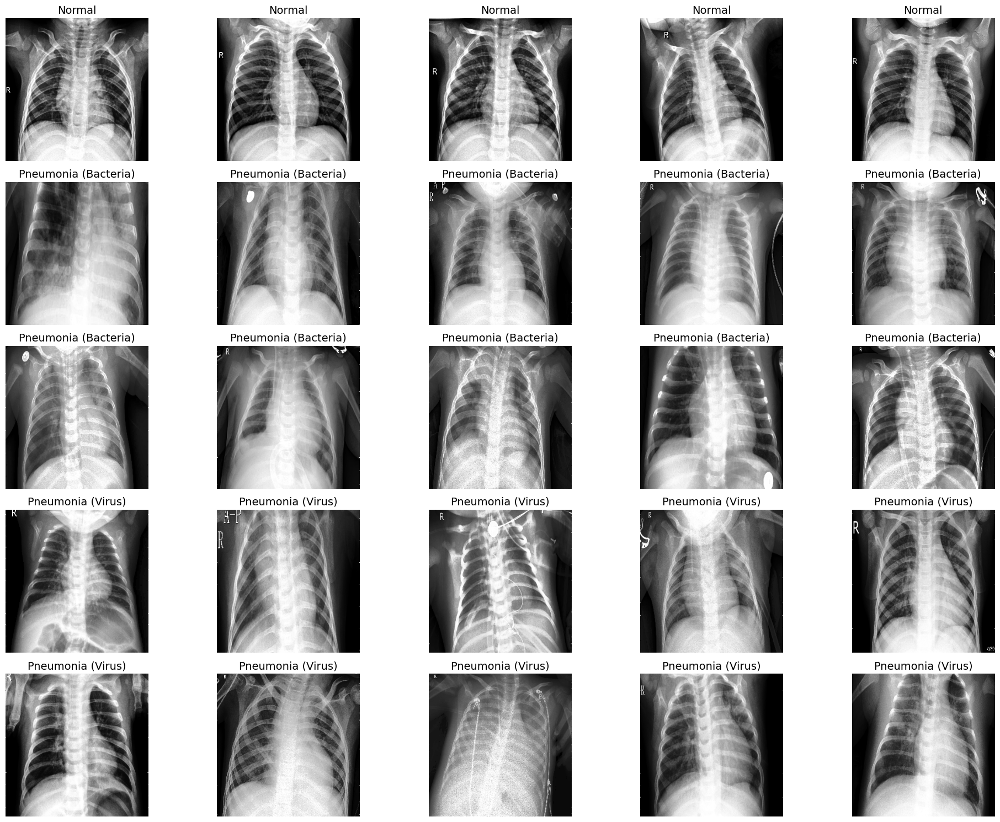

In [5]:
def apply_histogram_equalization(images):
    equalized_images = []
    for img in images:
        img = img.squeeze()
        equalized_img = cv2.equalizeHist((img * 255).astype(np.uint8))
        equalized_images.append(equalized_img / 255.0)
    return np.array(equalized_images).reshape(-1, img_size, img_size, 1)

X_train = apply_histogram_equalization(X_train)
X_val = apply_histogram_equalization(X_val)
X_test = apply_histogram_equalization(X_test)

visualize_samples()

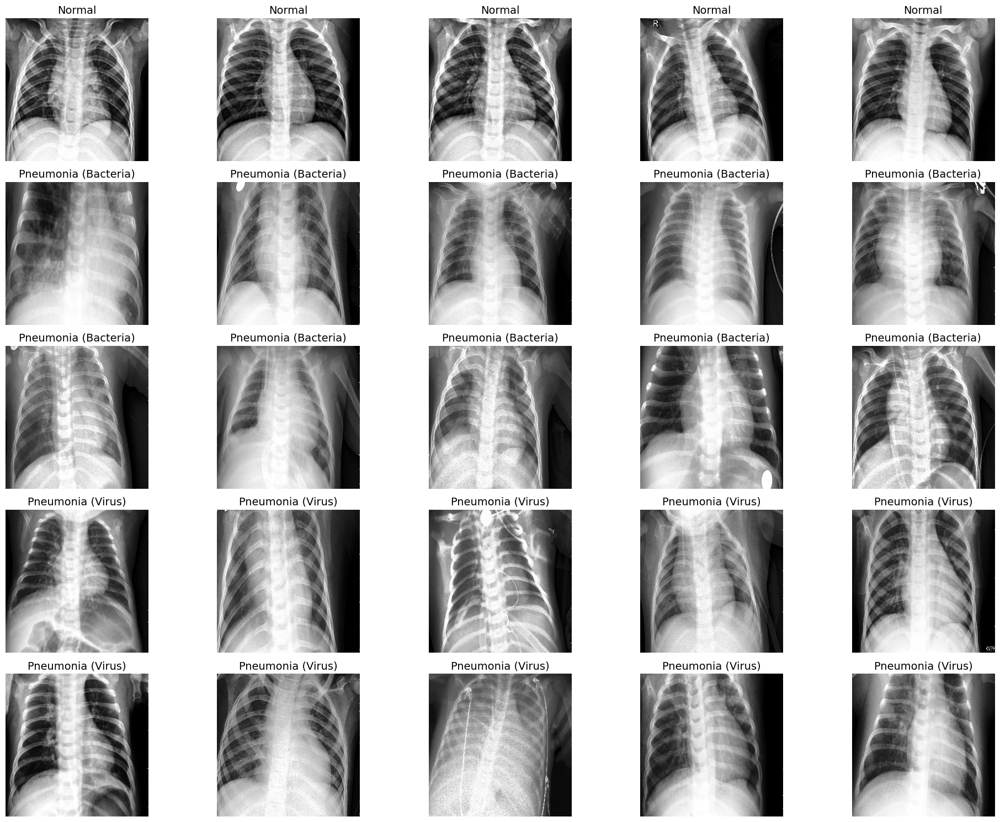

New image size: 275


In [6]:
def crop_out_left_top(images):
    cropped_images = []
    for img in images:
        cropped_img = img[25:, 25:]  # Crop 25 pixels from the top and left
        cropped_images.append(cropped_img)
    return np.array(cropped_images).reshape(-1, img_size - 25, img_size - 25, 1)

X_train = crop_out_left_top(X_train)
X_val = crop_out_left_top(X_val)
X_test = crop_out_left_top(X_test)

visualize_samples()

img_size = img_size - 25
print("New image size:", img_size)

#### Data augmentation

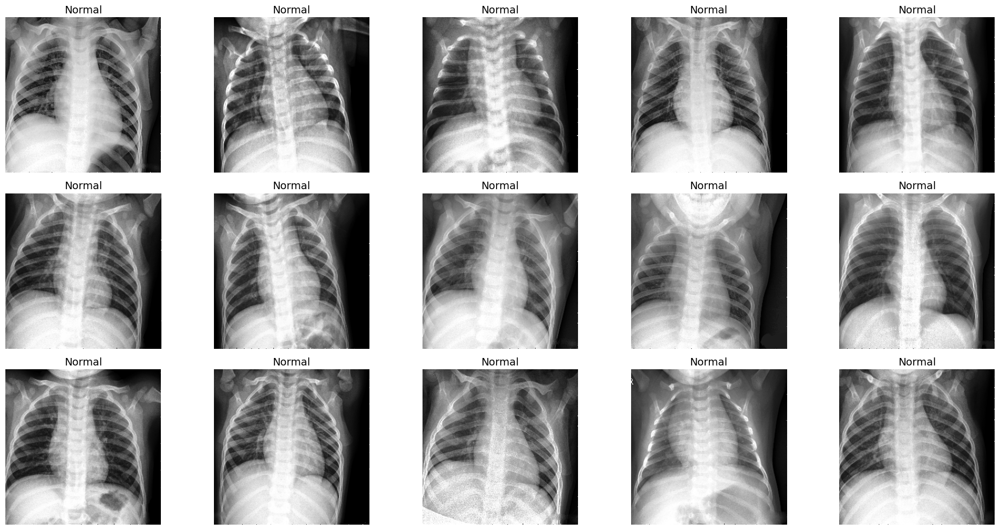

In [ ]:
def visualize_normal_samples(y_train):
    plt.figure(figsize=(20, 10))
    normal_indices = np.nonzero(y_train == 0)[0]

    for i in range(15):
        idx = normal_indices[-(i + 1)]  # Select the last indices
        plt.subplot(3, 5, i + 1)
        plt.imshow(X_train[idx].squeeze(), cmap='gray')
        plt.title("Normal", fontsize=14)
        plt.axis('off')

    plt.tight_layout()
    plt.show()

visualize_normal_samples(y_train)

In [ ]:
normal_count = np.sum(y_train == 0)
pneumonia_count = np.sum(y_train == 1)
images_to_generate = pneumonia_count - normal_count
normal_indices = np.nonzero(y_train == 0)[0]
pneumonia_indices = np.nonzero(y_train == 1)[0]

augmented_images = []
augmented_labels = []

augmentation_pipeline = get_training_augmentation_pipeline()

for _ in range(images_to_generate):
    idx = np.random.choice(normal_indices)
    image = X_train[idx].astype(np.float32)

    augmented_image = augmentation_pipeline(image=image)['image']

    augmented_images.append(augmented_image)
    augmented_labels.append(0)  # Label for normal class

augmented_images = np.array(augmented_images)
augmented_labels = np.array(augmented_labels)

X_train = np.concatenate((X_train, augmented_images), axis=0)
y_train = np.concatenate((y_train, augmented_labels), axis=0)

After augmentation:
7750 7750
Label distribution:
(array([0, 1]), array([3875, 3875], dtype=int64))


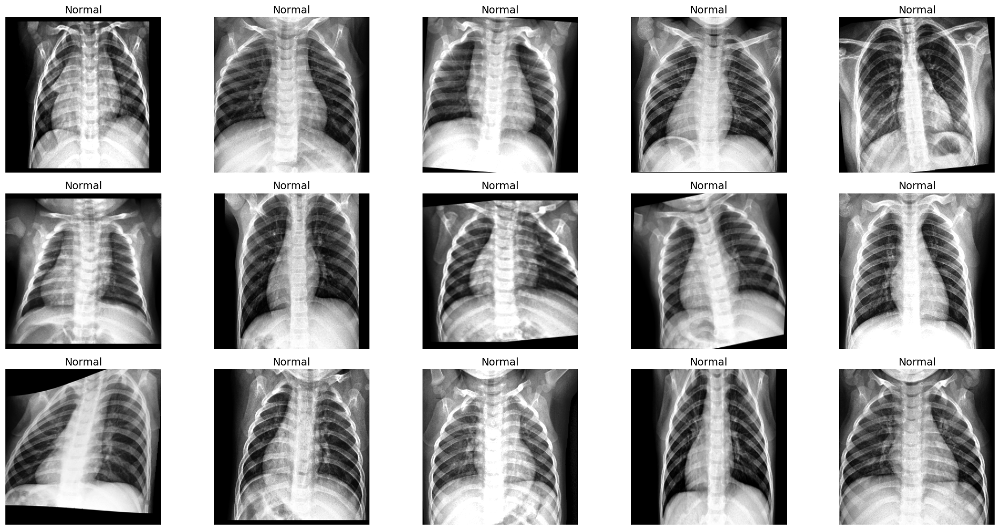

In [9]:
print("After augmentation:")
print(len(X_train), len(y_train))
print("Label distribution:")
print(np.unique(y_train, return_counts=True))

visualize_normal_samples(y_train)

### Q2: CNN Classifier (3 Pts)

In [10]:
# Inspired by https://www.kaggle.com/code/madz2000/pneumonia-detection-using-cnn-92-6-accuracy

configs = {
    "epochs": 20,
    "batch_size": 8,
    "earlystopping_patience": 4,
    "activation": "leakyrelu",
    "dropout": 0.4,
}

def cnn_model(dropout_rate, activation):
    inputs = Input(shape=(img_size, img_size, 1))
    
    x = Conv2D(32, (3, 3), strides=1, padding='same',
               kernel_regularizer=tf.keras.regularizers.l2(0.002))(inputs)
    if activation == 'relu':
        x = ReLU()(x)
    else:
        x = LeakyReLU(negative_slope=0.1)(x)
    x = BatchNormalization()(x)
    x = MaxPool2D((2, 2), strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = SpatialDropout2D(0.2)(x)
    
    x = Conv2D(64, (3, 3), strides=1, padding='same', 
               kernel_regularizer=tf.keras.regularizers.l2(0.002))(x)
    if activation == 'relu':
        x = ReLU()(x)
    else:
        x = LeakyReLU(negative_slope=0.1)(x)
    x = MaxPool2D((2, 2), strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = SpatialDropout2D(0.2)(x)
    
    x = Flatten()(x)
    x = Dense(units=64, activation=LeakyReLU(negative_slope=0.1))(x)
    x = Dropout(dropout_rate)(x)
    outputs = Dense(units=1)(x)
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    model.compile(optimizer="adam", loss=tf.keras.losses.BinaryCrossentropy(from_logits=True), metrics=['accuracy', Precision(), Recall(), AUC()])
    
    return model

X_train, y_train = shuffle(X_train, y_train, random_state=42)

# run = wandb.init(project='pneumonia-detection', config=configs)

model = cnn_model(configs["dropout"], configs["activation"])

# Update callbacks
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_loss', patience=2, verbose=1, factor=0.3, min_lr=0.000001, learning_rate=0.0001
)
early_stopping = EarlyStopping(
    monitor='val_loss', patience=configs["earlystopping_patience"], restore_best_weights=True
)

# Train the model
model.fit(
    X_train, y_train,
    batch_size=configs["batch_size"],
    epochs=configs["epochs"],
    validation_data=(X_val, y_val),
    callbacks=[
        learning_rate_reduction,
        early_stopping,
        # WandbMetricsLogger(log_freq=10),
        # WandbModelCheckpoint(filepath="models/model.keras")
    ],
)

# run.finish()

Epoch 1/20
969/969 ━━━━━━━━━━━━━━━━━━━━ 385s 392ms/step - accuracy: 0.8789 - auc: 0.8786 - loss: 5.8091 - precision: 0.8805 - recall: 0.8715 - val_accuracy: 0.8125 - val_auc: 0.8125 - val_loss: 28.2957 - val_precision: 0.7273 - val_recall: 1.0000 - learning_rate: 0.0010
Epoch 2/20
969/969 ━━━━━━━━━━━━━━━━━━━━ 373s 385ms/step - accuracy: 0.9522 - auc: 0.9524 - loss: 1.8134 - precision: 0.9508 - recall: 0.9530 - val_accuracy: 0.8125 - val_auc: 0.8125 - val_loss: 2.5541 - val_precision: 0.7778 - val_recall: 0.8750 - learning_rate: 0.0010
Epoch 3/20
969/969 ━━━━━━━━━━━━━━━━━━━━ 256s 264ms/step - accuracy: 0.9639 - auc: 0.9645 - loss: 0.8661 - precision: 0.9661 - recall: 0.9610 - val_accuracy: 0.8125 - val_auc: 0.8125 - val_loss: 1.8009 - val_precision: 0.7778 - val_recall: 0.8750 - learning_rate: 0.0010
Epoch 4/20
969/969 ━━━━━━━━━━━━━━━━━━━━ 150s 155ms/step - accuracy: 0.9695 - auc: 0.9702 - loss: 0.4314 - precision: 0.9709 - recall: 0.9674 - val_accuracy: 0.9375 - val_auc: 0.9375 - val_l

In [11]:
logits = model.predict(X_test)
y_probs = tf.sigmoid(logits).numpy()
y_pred = (y_probs > 0.5).astype("int32").squeeze()

print(classification_report(y_test, y_pred, target_names=["Normal", "Pneumonia"]))

20/20 ━━━━━━━━━━━━━━━━━━━━ 2s 102ms/step
              precision    recall  f1-score   support

      Normal       0.89      0.68      0.77       234
   Pneumonia       0.83      0.95      0.89       390

    accuracy                           0.85       624
   macro avg       0.86      0.81      0.83       624
weighted avg       0.85      0.85      0.84       624



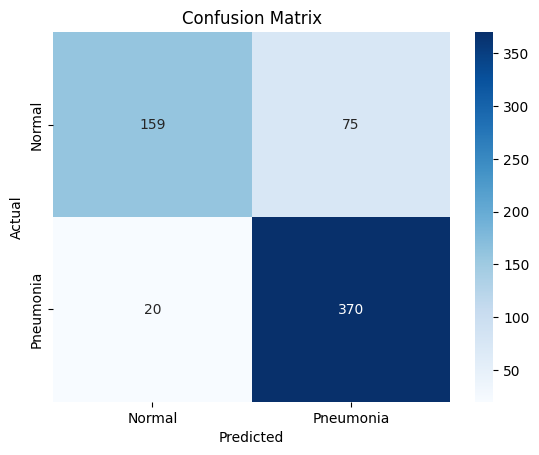

In [12]:
cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=["Normal", "Pneumonia"], yticklabels=["Normal", "Pneumonia"])
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix")
plt.show()

In [13]:
correct = np.nonzero(y_pred == y_test)[0]
incorrect = np.nonzero(y_pred != y_test)[0]

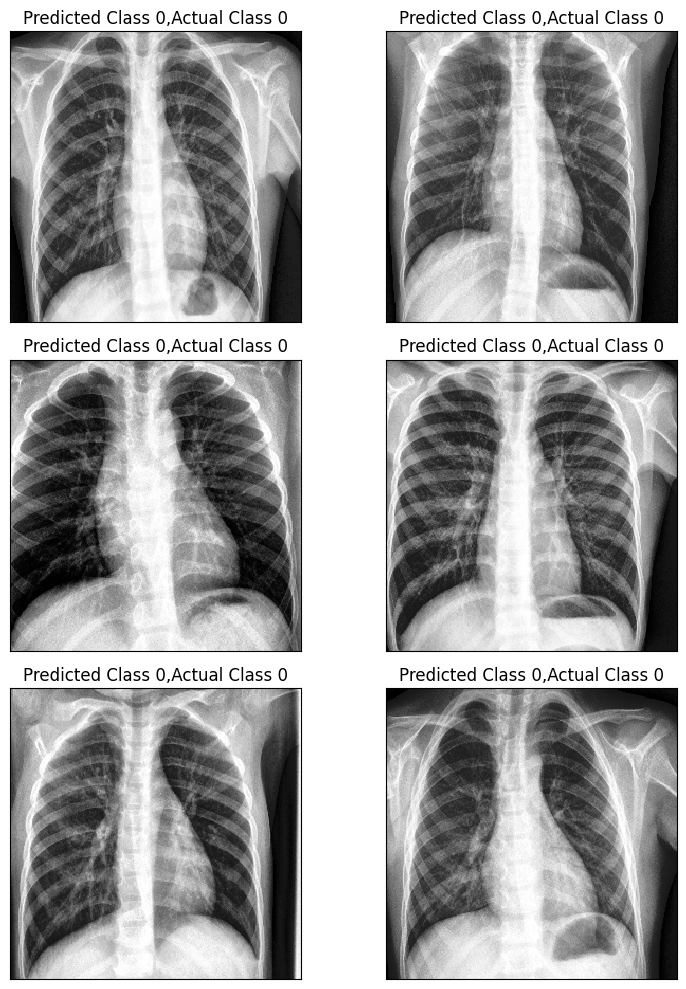

In [14]:
plt.figure(figsize=(10, 10))
i = 0
for c in correct[:6]:
    plt.subplot(3,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[c].reshape(img_size,img_size), cmap="gray", interpolation='none')
    plt.title("Predicted Class {},Actual Class {}".format(y_pred[c], y_test[c]))
    plt.tight_layout()
    i += 1

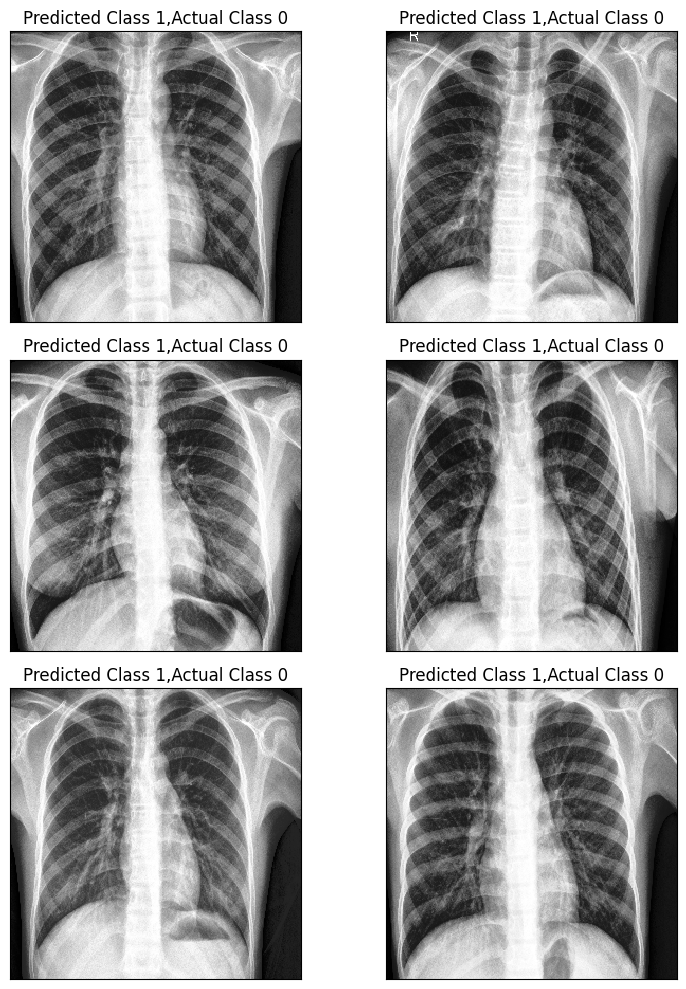

In [15]:
plt.figure(figsize=(10, 10))
i = 0
for c in incorrect[:6]:
    plt.subplot(3,2,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(X_test[c].reshape(img_size,img_size), cmap="gray", interpolation='none')
    plt.title("Predicted Class {},Actual Class {}".format(y_pred[c], y_test[c]))
    plt.tight_layout()
    i += 1

#### Q3: Integrated Gradients (5 Pts) 

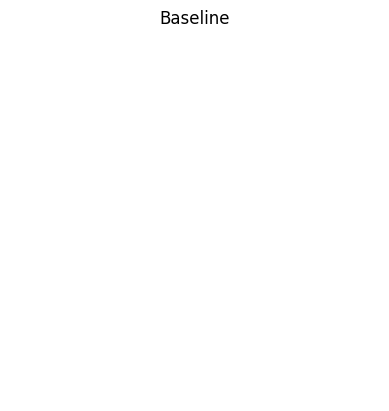

In [16]:
# baseline = tf.zeros((img_size, img_size, 1), dtype=tf.float32)

# mean_image = tf.reduce_mean(X_train.astype(np.float32), axis=0)
# baseline = tf.convert_to_tensor(mean_image, dtype=tf.float32)

baseline = tf.ones((img_size, img_size, 1), dtype=tf.float32) 

plt.imshow(baseline, cmap='gray', vmin=0, vmax=1)
plt.title("Baseline")
plt.axis('off')
plt.show()

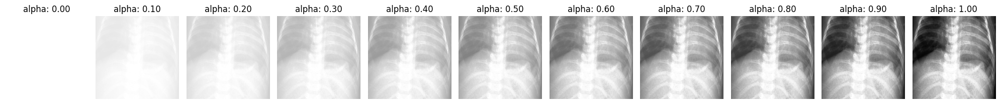

In [17]:
m_steps = 50
alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)

def interpolate_images(baseline, image, alphas):
  alphas_x = alphas[:, tf.newaxis, tf.newaxis, tf.newaxis]
  baseline_x = tf.expand_dims(baseline, axis=0)
  input_x = tf.expand_dims(image, axis=0)
  delta = input_x - baseline_x
  images = baseline_x +  alphas_x * delta
  return images

interpolated_images = interpolate_images(baseline=baseline, image=X_train[0].astype(np.float32), alphas=alphas)

fig = plt.figure(figsize=(20, 20))

i = 0
for alpha, image in zip(alphas[0::5], interpolated_images[0::5]):
  i += 1
  plt.subplot(1, len(alphas[0::5]), i)
  plt.title(f'alpha: {alpha:.2f}')
  plt.imshow(image[..., 0].numpy(), cmap='gray', vmin=0, vmax=1)
  plt.axis('off')

plt.tight_layout()

In [18]:
def compute_gradients(images, target_class=1):
    with tf.GradientTape() as tape:
        tape.watch(images)
        logits = model(images)
        probs = tf.nn.sigmoid(logits)[:, 0]
        if target_class == 0:
            probs = 1.0 - probs
    return tape.gradient(probs, images)

In [19]:
def integral_approximation(gradients):
  # riemann_trapezoidal
  grads = (gradients[:-1] + gradients[1:]) / tf.constant(2.0)
  integrated_gradients = tf.math.reduce_mean(grads, axis=0)
  return integrated_gradients

In [20]:
@tf.function
def one_batch(baseline, image, alpha_batch, target_class):
    # Generate interpolated inputs between baseline and input.
    interpolated_path_input_batch = interpolate_images(baseline=baseline, image=image, alphas=alpha_batch)

    # Compute gradients between model outputs and interpolated inputs.
    gradient_batch = compute_gradients(images=interpolated_path_input_batch, target_class=target_class)
    return gradient_batch

def integrated_gradients(baseline, image, target_class, m_steps=50, batch_size=32):
  # Generate alphas.
  alphas = tf.linspace(start=0.0, stop=1.0, num=m_steps+1)

  # Collect gradients.    
  gradient_batches = []
    
  # Iterate alphas range and batch computation for speed, memory efficiency, and scaling to larger m_steps.
  for alpha in tf.range(0, len(alphas), batch_size):
    from_ = alpha
    to = tf.minimum(from_ + batch_size, len(alphas))
    alpha_batch = alphas[from_:to]

    gradient_batch = one_batch(baseline, image, alpha_batch, target_class)
    gradient_batches.append(gradient_batch)
      
  # Concatenate path gradients together row-wise into single tensor.
  total_gradients = tf.concat(gradient_batches, axis=0)

  # Integral approximation through averaging gradients.
  avg_gradients = integral_approximation(gradients=total_gradients)

  # Scale integrated gradients with respect to input.
  integrated_gradients = (image - baseline) * avg_gradients

  return integrated_gradients

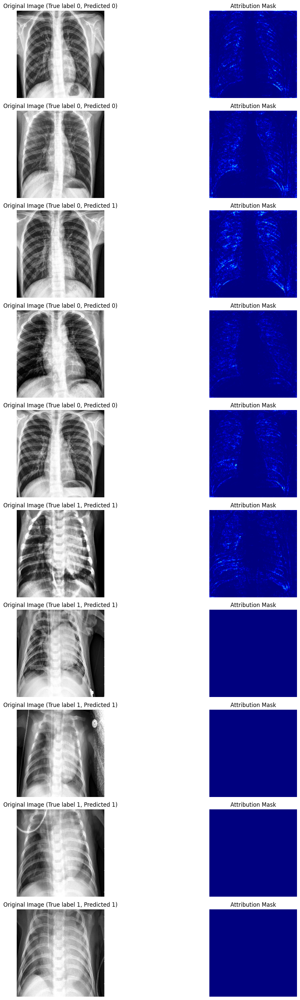

In [21]:
def plot_img_attributions(baseline, image_list, target_classes, predictions, m_steps=50, cmap=None, overlay_alpha=0.4):
    _, axs = plt.subplots(nrows=10, ncols=2, figsize=(15, 30))

    for i, (image, target_class, pred) in enumerate(zip(image_list, target_classes, predictions)):
        image = tf.convert_to_tensor(image, dtype=tf.float32)
        
        attributions = integrated_gradients(baseline=baseline, image=image, target_class=target_class, m_steps=m_steps)
        attribution_mask = tf.reduce_sum(tf.math.abs(attributions), axis=-1)
        
        row = i

        axs[row, 0].set_title(f'Original Image (True label {target_class}, Predicted {pred})')
        axs[row, 0].imshow(image, cmap='gray', vmin=0, vmax=1)
        axs[row, 0].axis('off')

        axs[row, 1].set_title('Attribution Mask')
        axs[row, 1].imshow(attribution_mask, cmap=cmap,)
        axs[row, 1].axis('off')

    plt.tight_layout()
    plt.show()

image_list = [X_test[0], X_test[1], X_test[2], X_test[3], X_test[4], 
              X_test[234], X_test[235], X_test[236], X_test[237], X_test[238]]
target_classes = [y_test[0], y_test[1], y_test[2], y_test[3], y_test[4], 
                  y_test[234], y_test[235], y_test[236], y_test[237], y_test[238]]
predictions = [y_pred[0], y_pred[1], y_pred[2], y_pred[3], y_pred[4], 
              y_pred[234], y_pred[235], y_pred[236], y_pred[237], y_pred[238]]

plot_img_attributions(baseline=baseline, image_list=image_list, target_classes=target_classes, predictions=predictions, m_steps=240, cmap='jet', overlay_alpha=0.4)

#### Q4: Grad-CAM (5 Pts)

C:\Users\afons\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor']
Received: inputs=Tensor(shape=(1, 275, 275, 1))
  warnings.warn(msg)


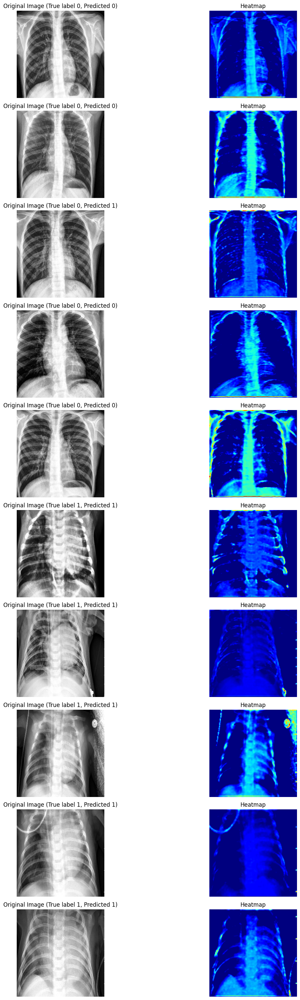

In [ ]:
# Inspired by https://keras.io/examples/vision/grad_cam/

def generate_gradcam_heatmap(model, img_array, last_conv_layer_name):
    img_array = tf.expand_dims(img_array, axis=0)
    
    grad_model = tf.keras.models.Model(
        model.inputs,
        [model.get_layer(last_conv_layer_name).output,
         model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, logits = grad_model(img_array, training=False)
        class_output = logits[:, 0]

    grads = tape.gradient(class_output, conv_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_output = conv_output[0]
    heatmap = conv_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.reduce_max(heatmap)
    
    return heatmap.numpy()

# Select 5 healthy and 5 disease samples
healthy_indices = np.nonzero(y_test == 0)[0][:5]
disease_indices = np.nonzero(y_test == 1)[0][:5]
selected_indices = np.concatenate((healthy_indices, disease_indices))

plt.figure(figsize=(15, 30))

for i, idx in enumerate(selected_indices):
    heatmap = generate_gradcam_heatmap(model, X_test[idx], last_conv_layer_name='conv2d_1')
    
    plt.subplot(len(selected_indices), 2, i * 2 + 1)
    plt.imshow(X_test[idx].reshape(img_size, img_size), cmap='gray', vmin=0, vmax=1)
    plt.title(f'Original Image (True label {y_test[idx]}, Predicted {y_pred[idx]})')
    plt.axis('off')
    
    plt.subplot(len(selected_indices), 2, i * 2 + 2)
    plt.imshow(heatmap, cmap='jet', vmin=0, vmax=1)
    plt.title("Heatmap")
    plt.axis('off')

plt.tight_layout()
plt.show()

#### Q5: Data Randomization Test (3 Pts)

In [23]:
random.shuffle(y_train)

model = cnn_model(configs["dropout"], configs["activation"])

# Update callbacks
learning_rate_reduction = ReduceLROnPlateau(
    monitor='val_accuracy', patience=2, verbose=1, factor=0.3, min_lr=0.000001
)
early_stopping = EarlyStopping(
    monitor='val_accuracy', patience=configs["earlystopping_patience"], restore_best_weights=True
)

# Train the model
history = model.fit(
    X_train, y_train,
    batch_size=configs["batch_size"],
    epochs=configs["epochs"],
    validation_data=(X_val, y_val),
    callbacks=[
        learning_rate_reduction,
        early_stopping,
    ],
)

Epoch 1/20
969/969 ━━━━━━━━━━━━━━━━━━━━ 155s 157ms/step - accuracy: 0.5112 - auc_1: 0.5113 - loss: 14.3692 - precision_1: 0.5096 - recall_1: 0.5145 - val_accuracy: 0.5000 - val_auc_1: 0.5469 - val_loss: 1.2780 - val_precision_1: 0.5000 - val_recall_1: 1.0000 - learning_rate: 0.0010
Epoch 2/20
969/969 ━━━━━━━━━━━━━━━━━━━━ 156s 161ms/step - accuracy: 0.5274 - auc_1: 0.5348 - loss: 1.4853 - precision_1: 0.5323 - recall_1: 0.4459 - val_accuracy: 0.5000 - val_auc_1: 0.4922 - val_loss: 0.8181 - val_precision_1: 0.5000 - val_recall_1: 0.2500 - learning_rate: 0.0010
Epoch 3/20
969/969 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - accuracy: 0.5493 - auc_1: 0.5739 - loss: 0.8008 - precision_1: 0.5942 - recall_1: 0.3048
Epoch 3: ReduceLROnPlateau reducing learning rate to 0.0003000000142492354.
969/969 ━━━━━━━━━━━━━━━━━━━━ 155s 160ms/step - accuracy: 0.5493 - auc_1: 0.5739 - loss: 0.8008 - precision_1: 0.5942 - recall_1: 0.3048 - val_accuracy: 0.4375 - val_auc_1: 0.2109 - val_loss: 0.8155 - val_precision_

##### 5.2 Integrated Gradients 

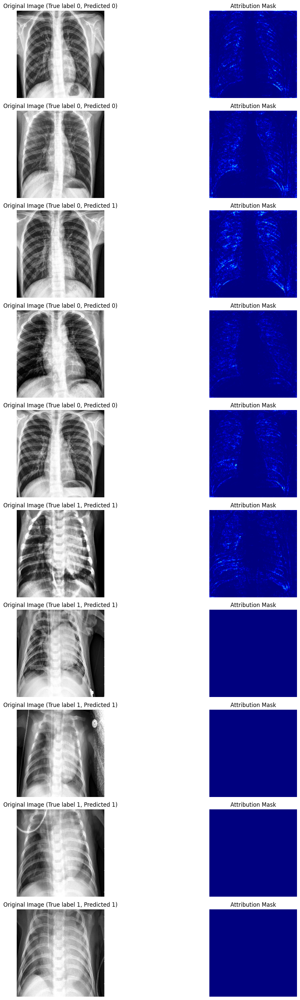

In [24]:
plot_img_attributions(baseline=baseline, image_list=image_list, target_classes=target_classes, 
                      predictions=predictions, m_steps=240, cmap='jet', overlay_alpha=0.4)

##### 5.3 Grad-CAM

C:\Users\afons\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_16']
Received: inputs=Tensor(shape=(1, 275, 275, 1))
  warnings.warn(msg)


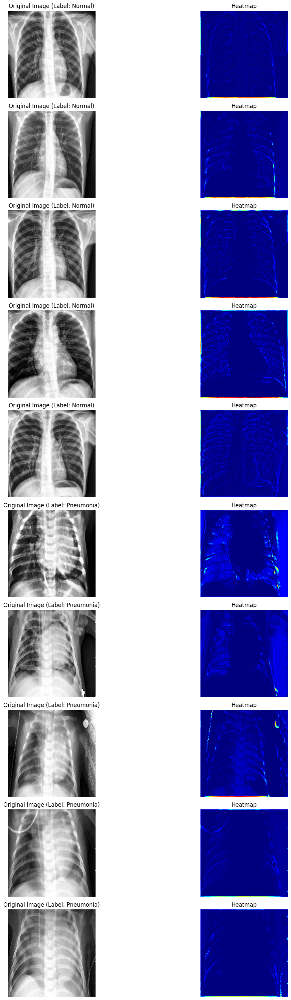

In [ ]:
# Select 5 healthy and 5 disease samples
healthy_indices = np.nonzero(y_test == 0)[0][:5]
disease_indices = np.nonzero(y_test == 1)[0][:5]
selected_indices = np.concatenate((healthy_indices, disease_indices))

plt.figure(figsize=(15, 30))

for i, idx in enumerate(selected_indices):
    heatmap = generate_gradcam_heatmap(model, X_test[idx], last_conv_layer_name='conv2d_3')
    
    plt.subplot(len(selected_indices), 2, i * 2 + 1)
    plt.imshow(X_test[idx].reshape(img_size, img_size), cmap='gray', vmin=0, vmax=1)
    plt.title(f"Original Image (Label: {'Normal' if y_test[idx] == 0 else 'Pneumonia'})")
    plt.axis('off')
    
    plt.subplot(len(selected_indices), 2, i * 2 + 2)
    plt.imshow(heatmap, cmap='jet', vmin=0, vmax=1)
    plt.title("Heatmap")
    plt.axis('off')

plt.tight_layout()
plt.show()